# Treinamento com CVC-ClinicDB, Kvasir-SEG, ETIS-LARIBDB
Este notebook realiza o treinamento usando três bases e aplica Data Augmentation com Albumentations.

In [ ]:
pip install -U albumentations

In [ ]:
%env TF_CPP_MIN_LOG_LEVEL=3

env: TF_CPP_MIN_LOG_LEVEL=3


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Imports
import os
import cv2
import skimage
import keras
import random
import numpy as np
import pandas as pd
import albumentations as albu
import matplotlib.pyplot as plt
import tensorflow as tf
from glob import glob
from tqdm import tqdm_notebook
from datetime import datetime
from skimage import morphology
from skimage.io import imshow
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import jaccard_score
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.utils import Sequence
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import warnings
warnings.simplefilter("ignore")
plt.style.use("ggplot")
%matplotlib inline

In [ ]:
# Tamanho e batch
IMG_WIDTH, IMG_HEIGHT = 352, 352
BATCH_SIZE = 4

In [ ]:
!cp -r /content/drive/MyDrive/kvasir-seg/kvasir-seg/Kvasir-SEG /content/
!cp -r /content/drive/MyDrive/CVC-ClinicDB/CVC-ClinicDB /content/
!cp -r /content/drive/MyDrive/ETIS-LaribDB/ETIS-LaribDB /content/

In [ ]:
# Diretórios das bases
train_dirs = [
    '/content/Kvasir-SEG',
    '/content/CVC-ClinicDB',
    '/content/ETIS-LaribDB'
]

In [ ]:
from tensorflow.keras.metrics import Metric
from tensorflow.keras import backend as K

# Define a função para calcular o coeficiente de Dice
def dice_coefficient(y_true, y_pred):
    smooth = 1e-7  # Constante de suavização para evitar divisão por zero
    y_true_f = tf.keras.backend.flatten(y_true)  # Achata o tensor dos rótulos verdadeiros para 1D
    y_pred_f = tf.keras.backend.flatten(y_pred)  # Achata o tensor das previsões para 1D
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)  # Soma da interseção entre rótulos e previsões
    # Fórmula do coeficiente de Dice: 2 * interseção / (soma dos elementos dos dois vetores)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

# Define a função de Focal Tversky Loss
def focal_tversky_loss(alpha=0.7, beta=0.3, gamma=0.75):
    def loss(y_true, y_pred):
        smooth = 1e-7  # Constante de suavização
        y_true_f = tf.keras.backend.flatten(y_true)  # Achata rótulos verdadeiros
        y_pred_f = tf.keras.backend.flatten(y_pred)  # Achata previsões
        intersection = tf.keras.backend.sum(y_true_f * y_pred_f)  # Verdadeiros positivos
        fn = tf.keras.backend.sum(y_true_f * (1 - y_pred_f))  # Falsos negativos
        fp = tf.keras.backend.sum((1 - y_true_f) * y_pred_f)  # Falsos positivos
        # Cálculo do índice de Tversky ponderando FN e FP
        tversky = (intersection + smooth) / (intersection + alpha * fn + beta * fp + smooth)
        # Aplica a função de perda focal: força o modelo a focar nas regiões mais difíceis
        return tf.keras.backend.pow((1 - tversky), gamma)
    return loss  # Retorna a função de perda configurada

# Define a função para calcular o coeficiente de IoU (Intersection over Union)
def iou_coefficient(y_true, y_pred):
    smooth = 1e-7  # Constante para evitar divisão por zero
    y_true_f = tf.keras.backend.flatten(y_true)  # Achata rótulos verdadeiros
    y_pred_f = tf.keras.backend.flatten(y_pred)  # Achata previsões
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)  # Soma da interseção
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection  # Soma da união
    # Retorna o valor de IoU suavizado
    return (intersection + smooth) / (union + smooth)

# Define a função de perda combinada: Focal Tversky Loss + Binary Crossentropy
def combined_loss(alpha=0.7, beta=0.3, gamma=1.33, ft_weight=0.7, bce_weight=0.3):
    # Obtém a função de perda Focal Tversky configurada
    focal_loss_fn = focal_tversky_loss(alpha=alpha, beta=beta, gamma=gamma)
    def loss(y_true, y_pred):
        ft_loss = focal_loss_fn(y_true, y_pred)  # Calcula a perda Focal Tversky
        bce_loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)  # Calcula a perda binária cruzada
        # Retorna a média ponderada das duas perdas
        return ft_weight * ft_loss + bce_weight * bce_loss
    return loss  # Retorna a função de perda combinada

In [ ]:
# Função de pré-processamento com cv2
def preprocess_image_mask(img_path, mask_path):
    image = cv2.imread(img_path)
    image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
    image = image / 255.0

    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
    mask = mask / 255.0
    mask = (mask > 0.5).astype(np.float32)

    return image, mask


In [ ]:
def load_dataset_paths(datasets_dirs):
    image_paths = []
    mask_paths = []

    for base_dir in datasets_dirs:
        img_dir = os.path.join(base_dir, 'images')
        mask_dir = os.path.join(base_dir, 'masks')

        # Coleta nomes de arquivos, sem extensão
        img_basenames = set([
            os.path.splitext(f)[0]
            for f in os.listdir(img_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])

        mask_basenames = set([
            os.path.splitext(f)[0]
            for f in os.listdir(mask_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])

        # Interseção dos nomes para garantir alinhamento
        common_basenames = sorted(img_basenames & mask_basenames)

        for base in common_basenames:
            # Busca o caminho da imagem e máscara correspondente
            img_path = next((os.path.join(img_dir, f) for f in os.listdir(img_dir)
                             if f.startswith(base) and f.lower().endswith(('.png', '.jpg', '.jpeg'))), None)
            mask_path = next((os.path.join(mask_dir, f) for f in os.listdir(mask_dir)
                              if f.startswith(base) and f.lower().endswith(('.png', '.jpg', '.jpeg'))), None)

            if img_path and mask_path:
                image_paths.append(img_path)
                mask_paths.append(mask_path)

    return image_paths, mask_paths

In [ ]:
def visualizar_pares(image_paths, mask_paths, num_amostras=5):
    """Mostra pares imagem–máscara lado a lado"""
    indices = random.sample(range(len(image_paths)), num_amostras)

    plt.figure(figsize=(12, 4 * num_amostras))

    for i, idx in enumerate(indices):
        image = cv2.imread(image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_paths[idx], cv2.IMREAD_GRAYSCALE)

        # Plota imagem
        plt.subplot(num_amostras, 2, 2 * i + 1)
        plt.imshow(image)
        plt.title(f'Imagem - {os.path.basename(image_paths[idx])}')
        plt.axis('off')

        # Plota máscara
        plt.subplot(num_amostras, 2, 2 * i + 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f'Máscara - {os.path.basename(mask_paths[idx])}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def threshold_predictions(preds, threshold=0.3):
    return (preds > threshold).astype(np.uint8)

In [ ]:
# Carrega caminhos
train_image_paths, train_mask_paths = load_dataset_paths(train_dirs)


In [ ]:
# Normaliza os nomes base (sem extensão) para comparação
image_basenames = set([os.path.splitext(os.path.basename(p))[0] for p in train_image_paths])
mask_basenames = set([os.path.splitext(os.path.basename(p))[0] for p in train_mask_paths])

# Verifica quais estão sobrando
missing_masks = image_basenames - mask_basenames
missing_images = mask_basenames - image_basenames

print("Imagens sem máscara correspondente:", missing_masks)
print("Máscaras sem imagem correspondente:", missing_images)

Imagens sem máscara correspondente: set()
Máscaras sem imagem correspondente: set()


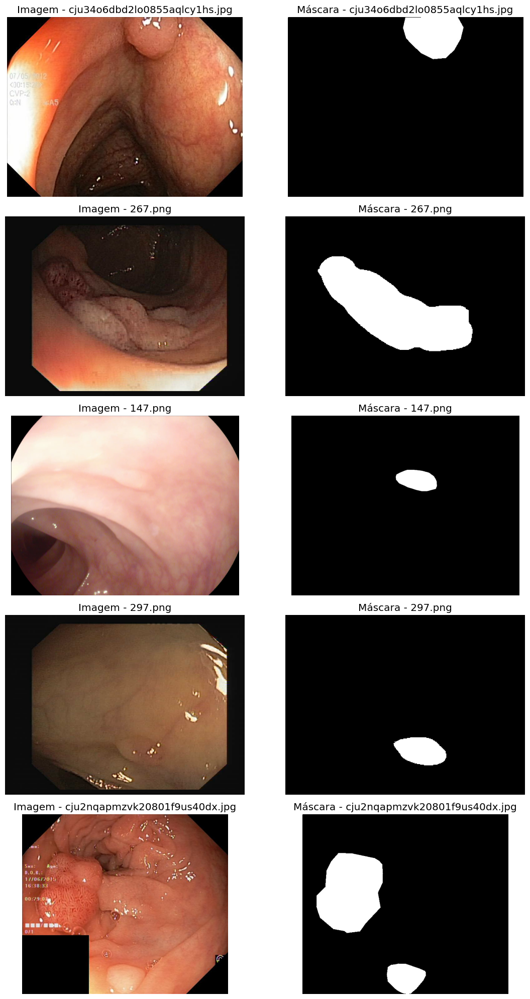

In [ ]:
visualizar_pares(train_image_paths, train_mask_paths, num_amostras=5)

In [ ]:
#Divide em treino/validação
X_train_paths, X_val_paths, y_train_paths, y_val_paths = train_test_split(train_image_paths, train_mask_paths, test_size=0.1, random_state=42)


In [ ]:
# Aumentações com Albumentations
aug_train = albu.Compose([
    albu.OneOf([
        albu.HorizontalFlip(p=1),
        albu.VerticalFlip(p=1),
        albu.RandomRotate90(p=0.5),
    ], p=0.9),
    albu.OneOf([
        albu.RandomBrightnessContrast(p=1),
        albu.ColorJitter(brightness=0.6, contrast=0.2, saturation=0.1, hue=0.1, p=1),
        albu.CLAHE(p=0.5),
    ], p=0.9),
    albu.OneOf([
        albu.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=1),
        albu.GridDistortion(p=1),
        albu.OpticalDistortion(distort_limit=0.05, shift_limit=0.05, p=1),
    ], p=0.8),
    albu.Affine(
        scale=(0.9, 1.1),
        shear=(-5, 5),
        p=0.7
    ),
    albu.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
], p=1)


In [ ]:
# Gerador com Albumentations e carregamento sob demanda
class AlbumentationsDataGenerator(Sequence):
    def __init__(self, image_paths, mask_paths, batch_size, augment_fn, shuffle=True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.batch_size = batch_size
        self.augment_fn = augment_fn
        self.shuffle = shuffle
        self.indices = np.arange(len(image_paths))
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch_images = []
        batch_masks = []

        for i in batch_indices:
            # Load and resize image and mask without initial normalization
            img = cv2.imread(self.image_paths[i])
            img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
            mask = cv2.imread(self.mask_paths[i], cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))

            # Albumentations works best with uint8 images
            # Ensure image is in RGB format for Albumentations (if using color transforms)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Apply augmentations
            augmented = self.augment_fn(image=img, mask=mask)
            augmented_image = augmented["image"]
            augmented_mask = augmented["mask"]

            # Normalize image and binarize mask after augmentation
            augmented_image = augmented_image / 255.0
            augmented_mask = (augmented_mask > 127).astype(np.float32) # Assuming mask values are 0-255

            batch_images.append(augmented_image)
            batch_masks.append(augmented_mask)

        # Expand mask dimensions
        return np.array(batch_images), np.expand_dims(np.array(batch_masks), axis=-1)


    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)



# **Construção do Modelo**

In [ ]:
# Função para construir a U-Net com EfficientNetB3 como encoder
def build_unet_efficientnetb3(input_shape=(352, 352, 3),dropout=0.1):
    base_model = EfficientNetB3(include_top=False, weights='imagenet', input_shape=input_shape)

    # Camadas de skip connections
    skips = [
        base_model.get_layer('block1a_activation').output,  # 176x176
        base_model.get_layer('block2b_add').output,         # 88x88
        base_model.get_layer('block3b_add').output,         # 44x44
        base_model.get_layer('block4b_add').output,         # 22x22
    ]
    encoder_output = base_model.get_layer('block6a_activation').output  # 11x11

    # Caminho de expansão (decoder)
    x = encoder_output
    for i, skip in reversed(list(enumerate(skips))):
        x = Conv2DTranspose(256 // (2**i), (3, 3), strides=(2, 2), padding='same')(x)
        x = concatenate([x, skip])
        x = Dropout(dropout)(x)
        x = Conv2D(256 // (2**i), (3, 3), padding='same', activation='relu')(x)
        x = BatchNormalization()(x)
        x = Conv2D(256 // (2**i), (3, 3), padding='same', activation='relu')(x)
        x = BatchNormalization()(x)

    # Upsample final para 352x352
    x = Conv2DTranspose(16, (3, 3), strides=(2, 2), padding='same')(x)
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(x)

    model = Model(inputs=base_model.input, outputs=outputs)
    return model


In [ ]:
# Criação do modelo
input_shape = (IMG_WIDTH, IMG_HEIGHT, 3)
model = build_unet_efficientnetb3(input_shape=input_shape)


43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
# Compila o modelo
model.compile(optimizer='adam', loss=combined_loss(), metrics=[dice_coefficient, iou_coefficient])

In [ ]:
# callbacks
callbacks = [
    tf.keras.callbacks.ModelCheckpoint("melhor_modelo.keras", monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False),
    tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-5, verbose=1),
]


# **Treinamento do Modelo**

In [ ]:
# Instancia geradores
train_generator = AlbumentationsDataGenerator(X_train_paths, y_train_paths, batch_size= BATCH_SIZE, augment_fn=aug_train)
val_generator = AlbumentationsDataGenerator(X_val_paths, y_val_paths, batch_size= BATCH_SIZE, augment_fn=lambda **kwargs: kwargs, shuffle=False)

In [ ]:
%%time
resultados = model.fit(train_generator,
          validation_data=val_generator,
          epochs=150,
          callbacks=callbacks)

Epoch 1/150
407/407 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step - dice_coefficient: 0.4887 - iou_coefficient: 0.3462 - loss: 0.3892
Epoch 1: val_loss improved from inf to 0.84768, saving model to melhor_modelo.keras
407/407 ━━━━━━━━━━━━━━━━━━━━ 352s 538ms/step - dice_coefficient: 0.4889 - iou_coefficient: 0.3464 - loss: 0.3889 - val_dice_coefficient: 0.0174 - val_iou_coefficient: 0.0088 - val_loss: 0.8477 - learning_rate: 0.0010
Epoch 2/150
407/407 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step - dice_coefficient: 0.6726 - iou_coefficient: 0.5225 - loss: 0.2182
Epoch 2: val_loss improved from 0.84768 to 0.77403, saving model to melhor_modelo.keras
407/407 ━━━━━━━━━━━━━━━━━━━━ 134s 328ms/step - dice_coefficient: 0.6726 - iou_coefficient: 0.5225 - loss: 0.2182 - val_dice_coefficient: 0.0618 - val_iou_coefficient: 0.0322 - val_loss: 0.7740 - learning_rate: 0.0010
Epoch 3/150
407/407 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step - dice_coefficient: 0.7178 - iou_coefficient: 0.5745 - loss: 0.1848
Epoch 3: val_loss did not

# **Avaliação do Modelo**

In [ ]:
def plotar_resultado_treinamento(historico):
    """
    Plota curvas de loss, Dice coefficient e IoU durante o treinamento.
    """
    loss = historico.history['loss']
    val_loss = historico.history['val_loss']

    dice = historico.history.get('dice_coefficient')
    val_dice = historico.history.get('val_dice_coefficient')

    iou = historico.history.get('iou_coefficient')
    val_iou = historico.history.get('val_iou_coefficient')

    epocas = range(1, len(loss) + 1)

    plt.figure(figsize=(18, 5))

    # Subplot 1: Loss
    plt.subplot(1, 3, 1)
    plt.plot(epocas, loss, label='Treino')
    plt.plot(epocas, val_loss, label='Validação')
    plt.plot(np.argmin(val_loss), np.min(val_loss), 'ro', label='Melhor Val. Loss')
    plt.title('Loss por Época')
    plt.xlabel('Épocas')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()

    # Subplot 2: Dice Coefficient (se disponível)
    if dice and val_dice:
        plt.subplot(1, 3, 2)
        plt.plot(epocas, dice, label='Treino')
        plt.plot(epocas, val_dice, label='Validação')
        plt.plot(np.argmax(val_dice), np.max(val_dice), 'go', label='Melhor Val. Dice')
        plt.title('Dice Coefficient por Época')
        plt.xlabel('Épocas')
        plt.ylabel('Dice Coefficient')
        plt.grid(True)
        plt.legend()

    # Subplot 3: IoU Coefficient (se disponível)
    if iou and val_iou:
        plt.subplot(1, 3, 3)
        plt.plot(epocas, iou, label='Treino')
        plt.plot(epocas, val_iou, label='Validação')
        plt.plot(np.argmax(val_iou), np.max(val_iou), 'bo', label='Melhor Val. IoU')
        plt.title('IoU Coefficient por Época')
        plt.xlabel('Épocas')
        plt.ylabel('IoU Coefficient')
        plt.grid(True)
        plt.legend()

    plt.suptitle("Curvas de Aprendizado", fontsize=16)
    plt.tight_layout()
    plt.show()

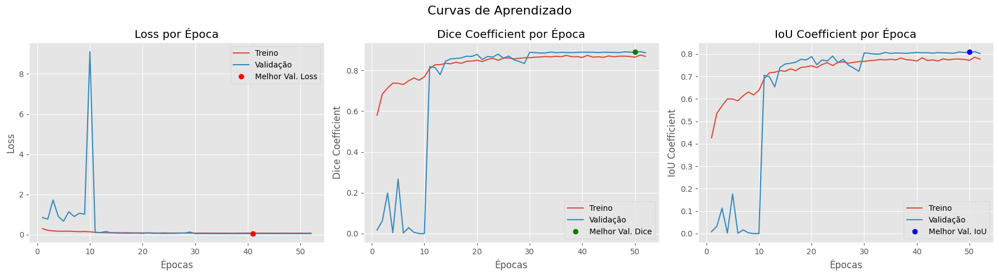

In [ ]:
plotar_resultado_treinamento(resultados)

# **Avaliação do Modelo no CVC-ColonDB**

In [ ]:
# Avaliação no CVS_ColonDB
colondb_image_dir = "/content/drive/MyDrive/CVC-ColonDB/CVC-ColonDB/images"
colondb_mask_dir = "/content/drive/MyDrive/CVC-ColonDB/CVC-ColonDB/masks"

In [ ]:
# Carrega os caminhos
colondb_image_paths = sorted(glob(os.path.join(colondb_image_dir, '*.png')))
colondb_mask_paths = sorted(glob(os.path.join(colondb_mask_dir, '*.png')))

# Cria dicionários para facilitar a consulta
image_dict = {os.path.splitext(os.path.basename(p))[0].replace(' (1)', ''): p for p in colondb_image_paths}
mask_dict = {os.path.splitext(os.path.basename(p))[0]: p for p in colondb_mask_paths}

# Encontra nomes de base comuns e cria listas pareadas
common_basenames = sorted(list(image_dict.keys() & mask_dict.keys()))
colondb_image_paths = [image_dict[base] for base in common_basenames]
colondb_mask_paths = [mask_dict[base] for base in common_basenames]

In [ ]:
# Verifica se os nomes base (sem extensão) estão pareados corretamente
for img_path, mask_path in zip(colondb_image_paths, colondb_mask_paths):
      #Retira '(1)' do nome base da imagem para comparação, se existir
    img_basename = os.path.splitext(os.path.basename(img_path))[0].replace(' (1)', '')
    mask_basename = os.path.splitext(os.path.basename(mask_path))[0]
    assert img_basename == mask_basename, f"Desalinhado: {img_path} vs {mask_path}"

print("Os caminhos da imagem e da máscara estão alinhados.")

Os caminhos da imagem e da máscara estão alinhados.


In [ ]:
# Métricas de avaliação
from sklearn.metrics import jaccard_score, f1_score, accuracy_score, precision_score, recall_score, confusion_matrix
ious, dices, accs, precs, recalls = [], [], [], [], []

In [ ]:
#pré-processamento
for img_path, mask_path in tqdm_notebook(zip(colondb_image_paths, colondb_mask_paths), total=len(colondb_image_paths)):
    image, mask = preprocess_image_mask(img_path, mask_path)
    image_input = np.expand_dims(image, axis=0)

  0%|          | 0/380 [00:00<?, ?it/s]

In [ ]:
# Previsões
pred = model.predict(image_input)[0, :, :, 0]
pred_bin = threshold_predictions(pred, threshold=0.3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


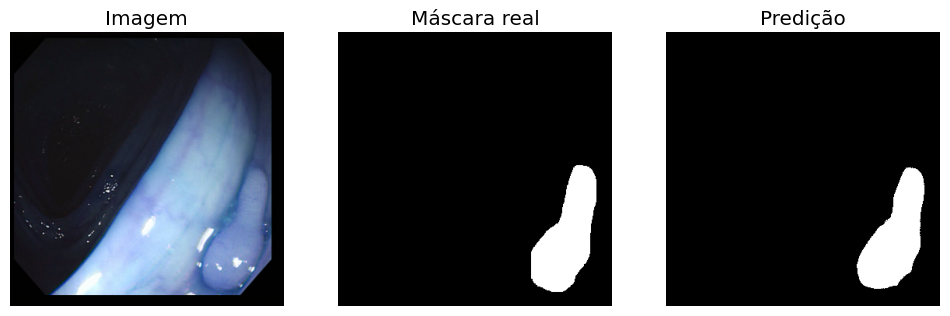

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title("Imagem")
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Máscara real")
plt.imshow(mask, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Predição")
plt.imshow(pred_bin, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
# Flatten para comparação pixel a pixel, achata para métricas tipo IoU, Dice etc.)
flat_pred = pred_bin.flatten()
flat_mask = mask.flatten()

In [ ]:
 #  Cálculo das Métricas
ious.append(jaccard_score(flat_mask, flat_pred, average='binary'))
dices.append(f1_score(flat_mask, flat_pred, average='binary'))
accs.append((flat_mask == flat_pred).mean())
precs.append(precision_score(flat_mask, flat_pred))
recalls.append(recall_score(flat_mask, flat_pred))

In [ ]:
## Resultados Médios
print("--- Avaliação no CVC-ColonDB ---")
print(f"IoU Médio: {np.mean(ious):.4f}")
print(f"Dice Médio: {np.mean(dices):.4f}")
print(f"Acurácia Média: {np.mean(accs):.4f}")
print(f"Precisão Média: {np.mean(precs):.4f}")
print(f"Recall Médio: {np.mean(recalls):.4f}")

--- Avaliação no CVC-ColonDB ---
IoU Médio: 0.9083
Dice Médio: 0.9519
Acurácia Média: 0.9939
Precisão Média: 0.9737
Recall Médio: 0.9312


In [ ]:
all_true_masks = []
all_pred_masks = []

In [ ]:
# Anexa a máscara e a predição às listas para o cálculo da matriz de confusão.
all_true_masks.append(flat_mask) # Achatar para um array 1D para concatenação.
all_pred_masks.append(flat_pred) # Achatar para um array 1D para concatenação.

In [ ]:
y_true_flat = np.concatenate(all_true_masks)
preds_flat = np.concatenate(all_pred_masks)

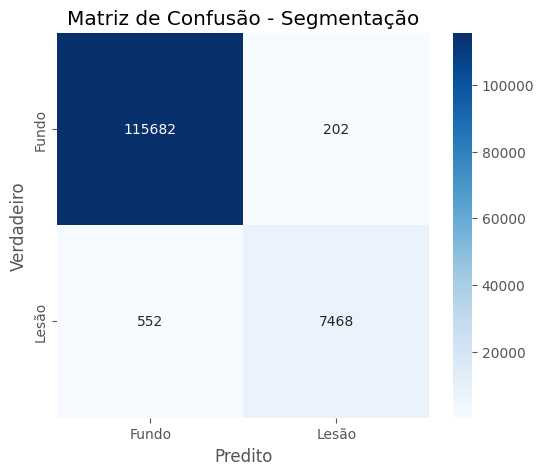

In [ ]:
# Matriz de confusão
import seaborn as sns
cm = confusion_matrix(y_true_flat, preds_flat)

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Fundo', 'Lesão'], yticklabels=['Fundo', 'Lesão'])
plt.xlabel('Predito')
plt.ylabel('Verdadeiro')
plt.title('Matriz de Confusão - Segmentação')
plt.show()


In [ ]:
# --- Função para cálculo do Dice ---
def compute_dice(gt, pred):
    intersection = np.logical_and(gt, pred)
    return 2. * intersection.sum() / (gt.sum() + pred.sum() + 1e-6)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


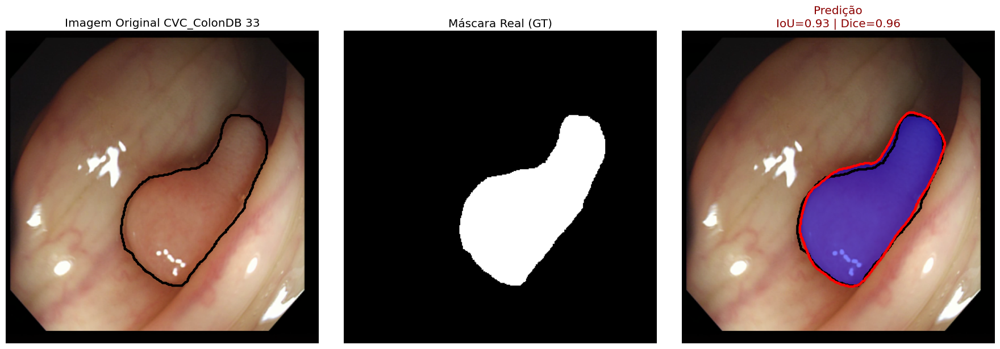

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


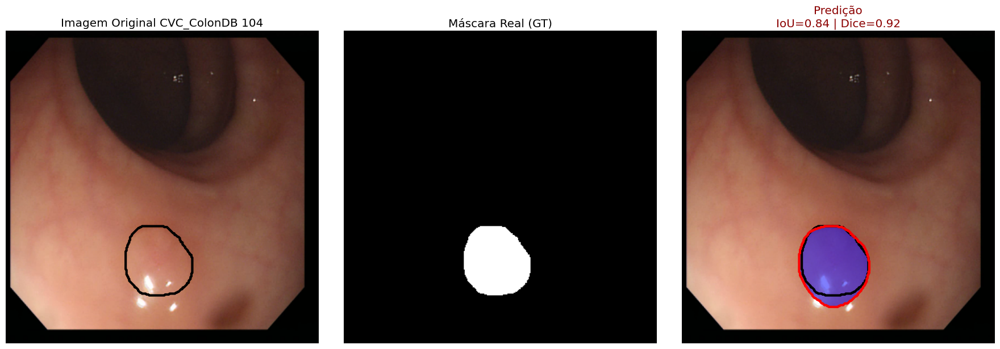

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


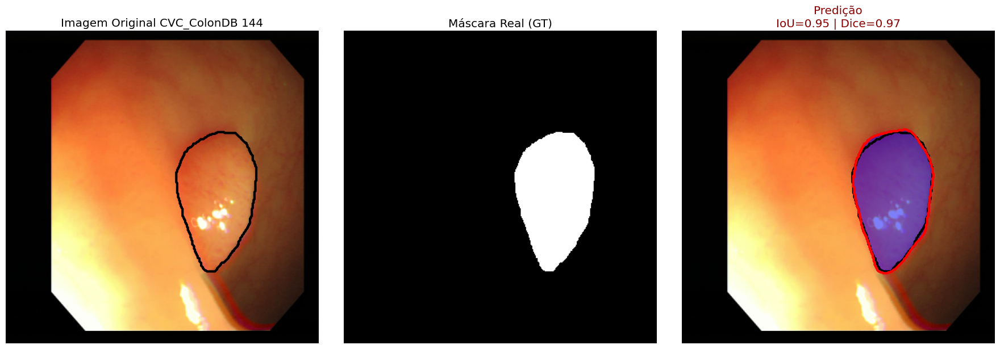

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


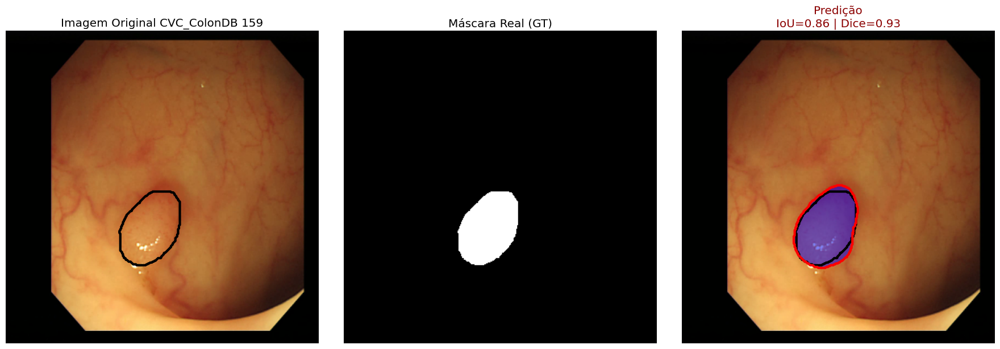

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


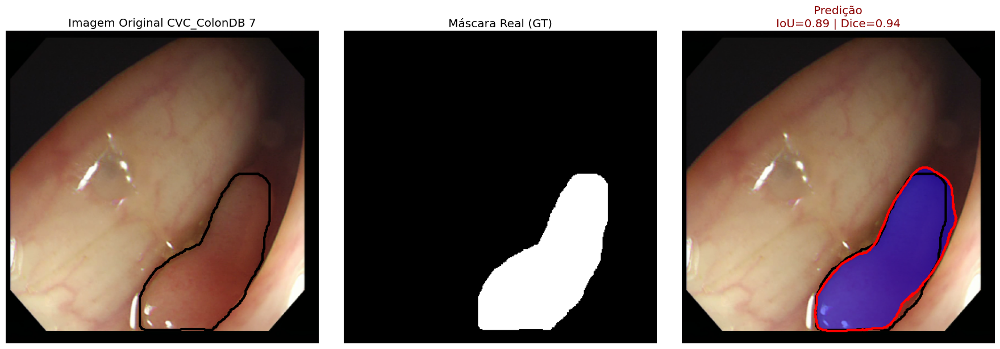

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


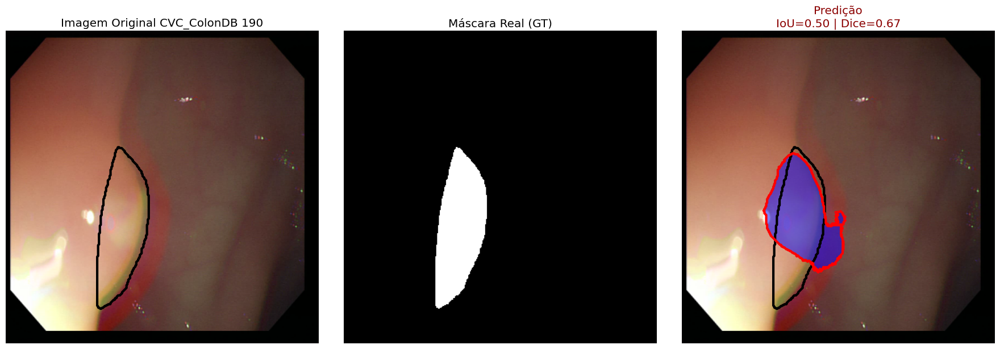

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


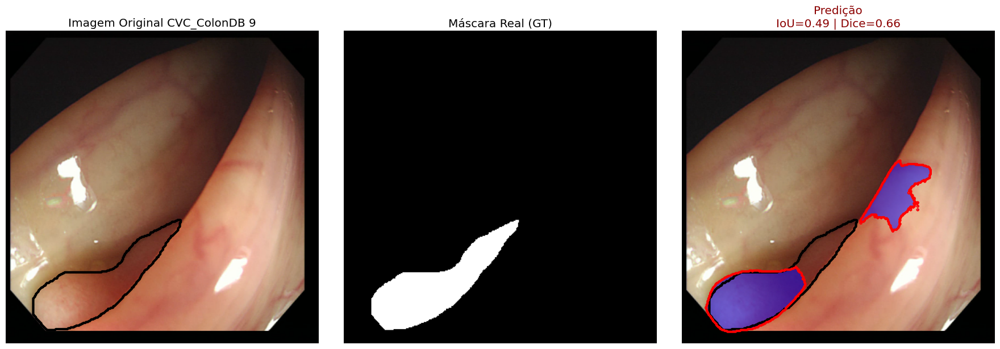

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


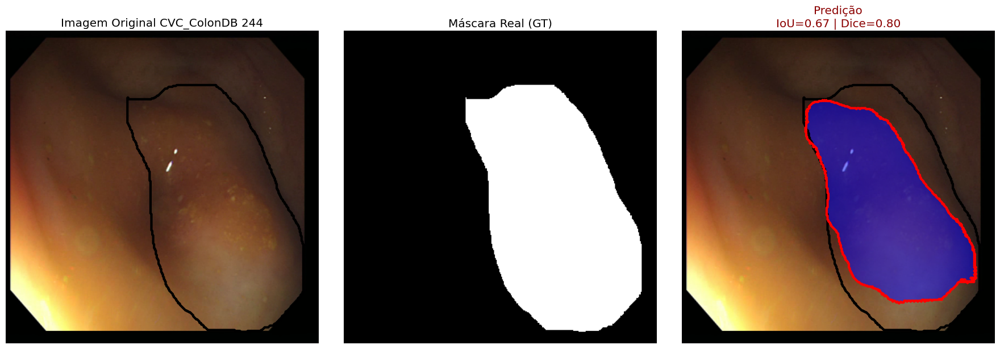

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


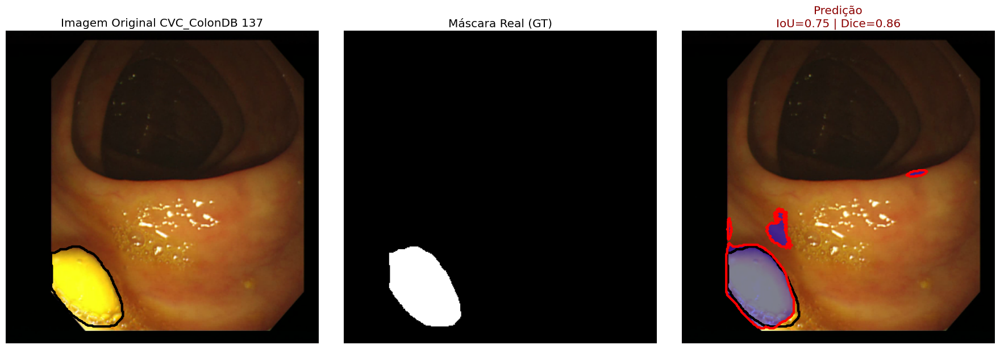

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


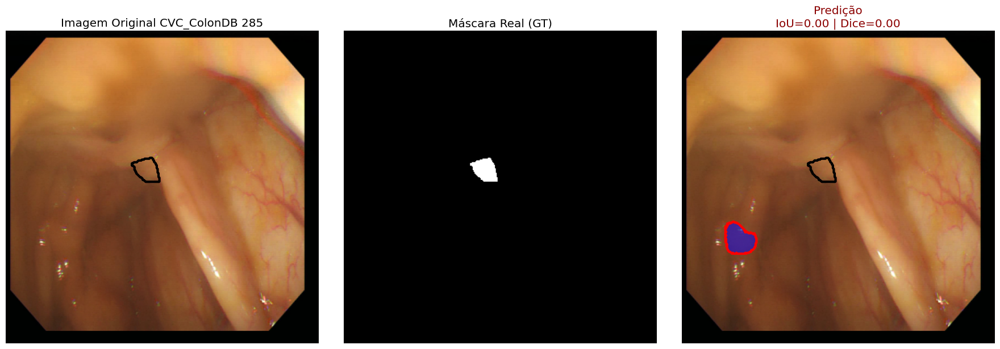

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


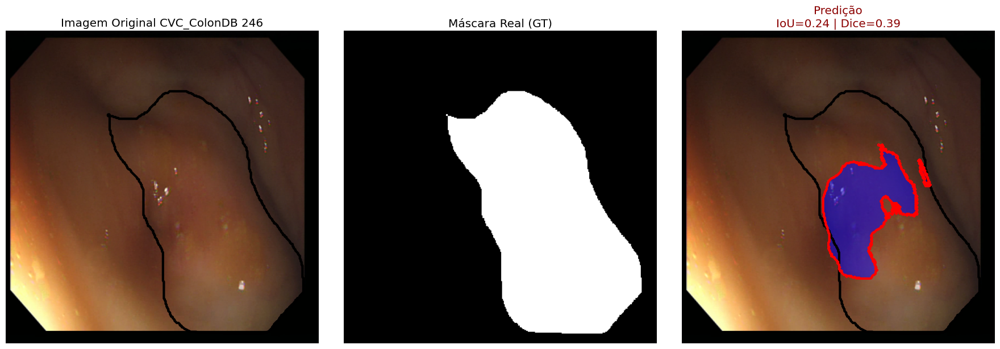

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


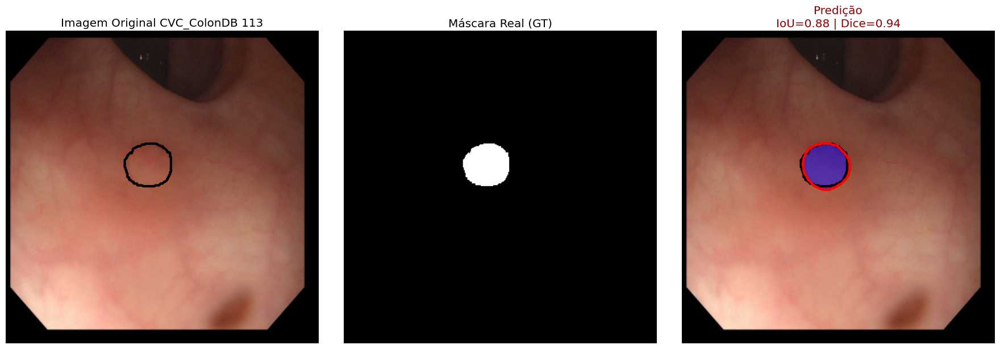

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


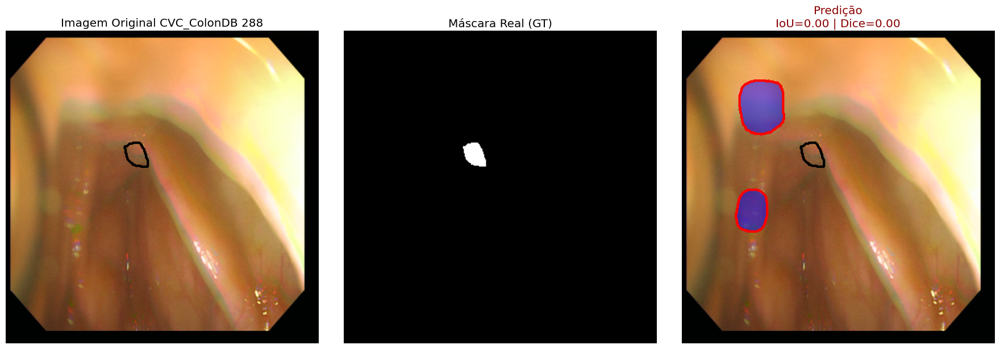

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


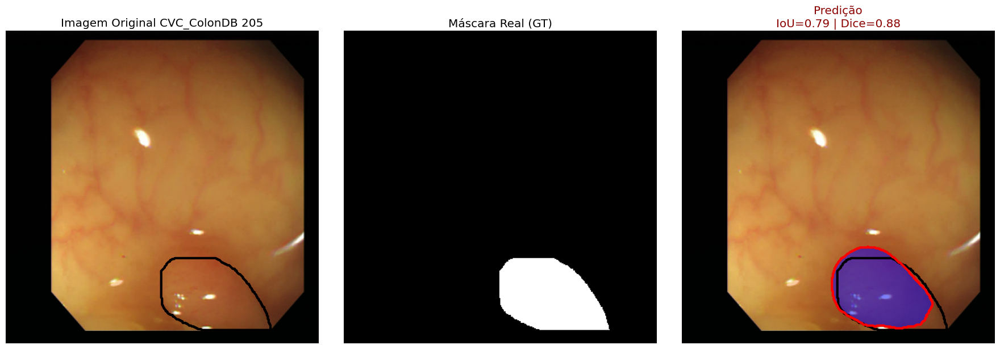

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


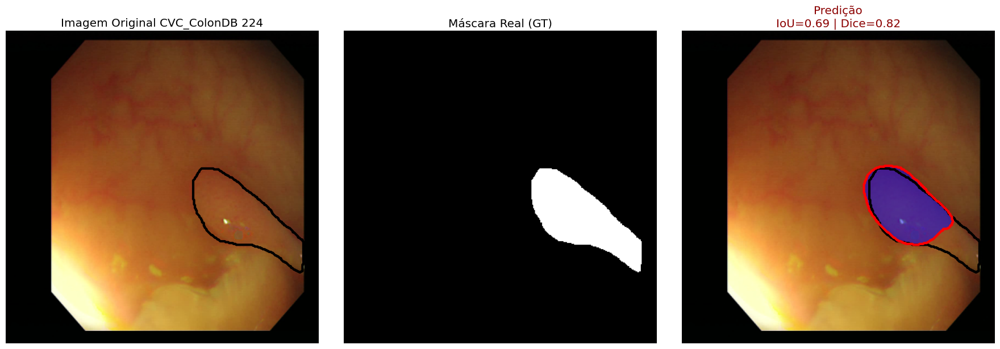

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


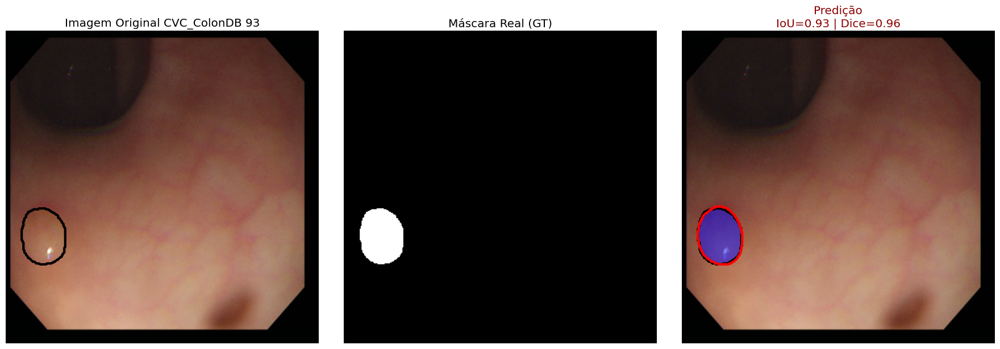

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


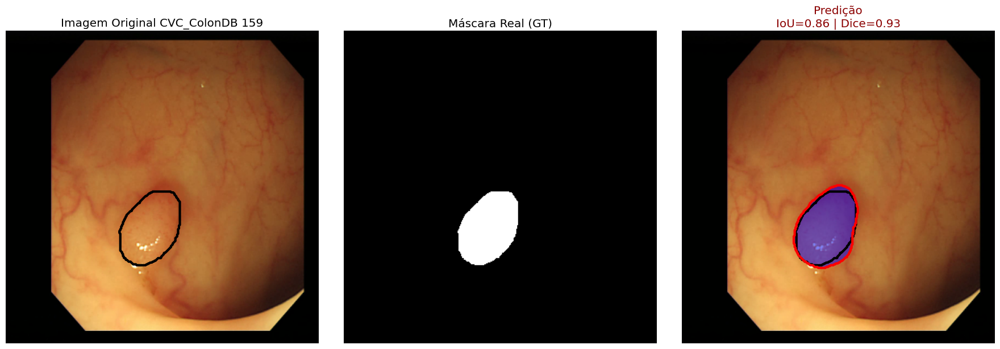

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


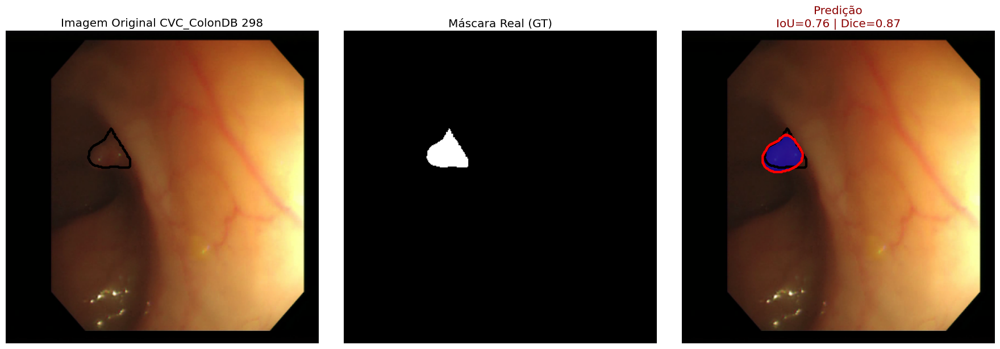

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


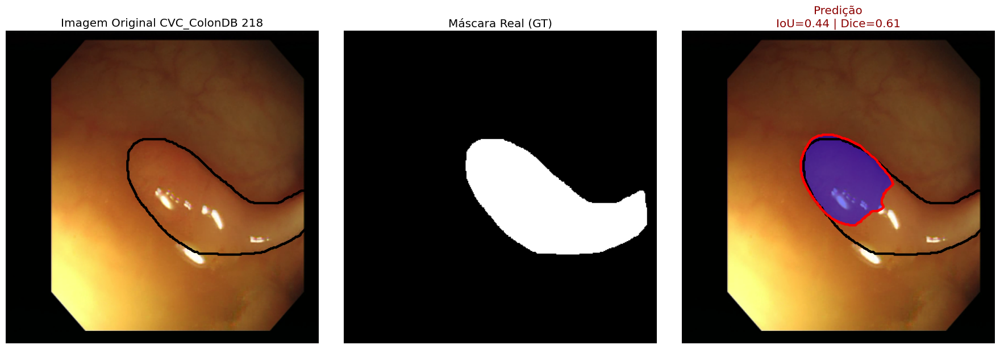

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


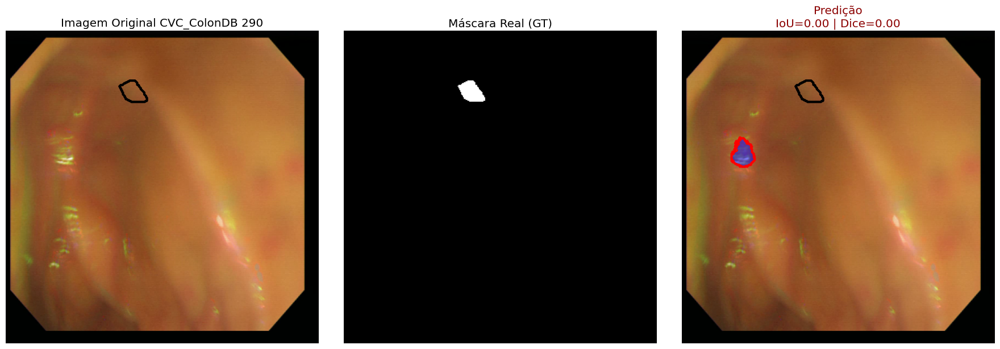

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


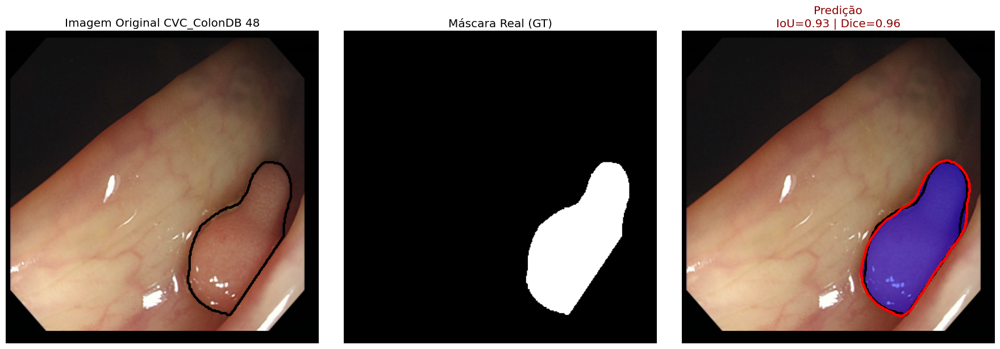

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


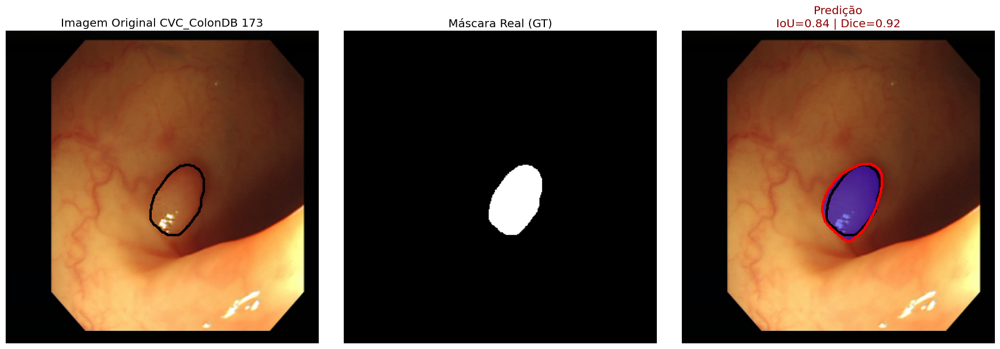

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


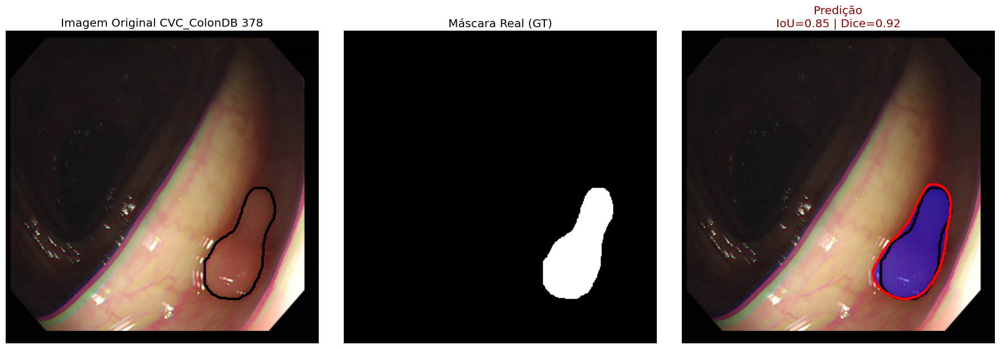

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


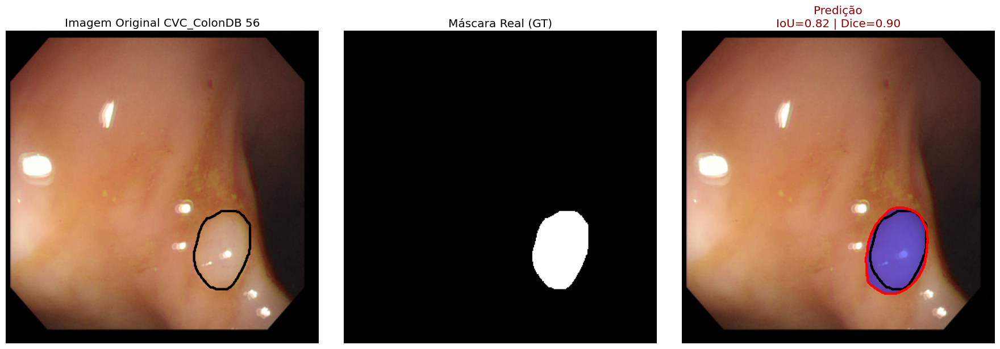

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


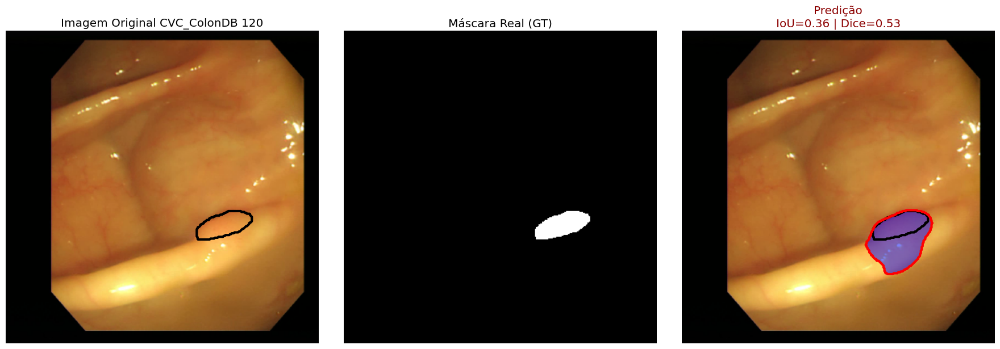

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


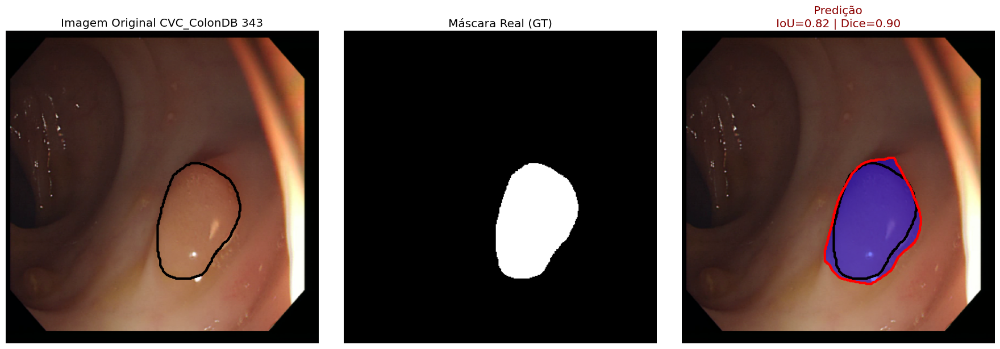

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step


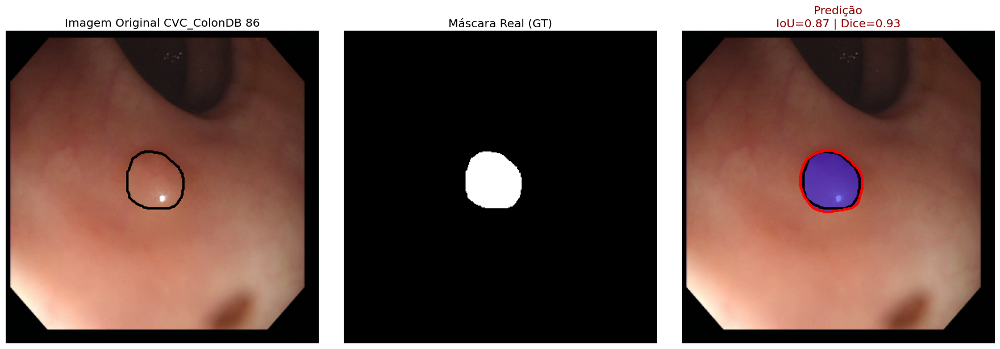

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


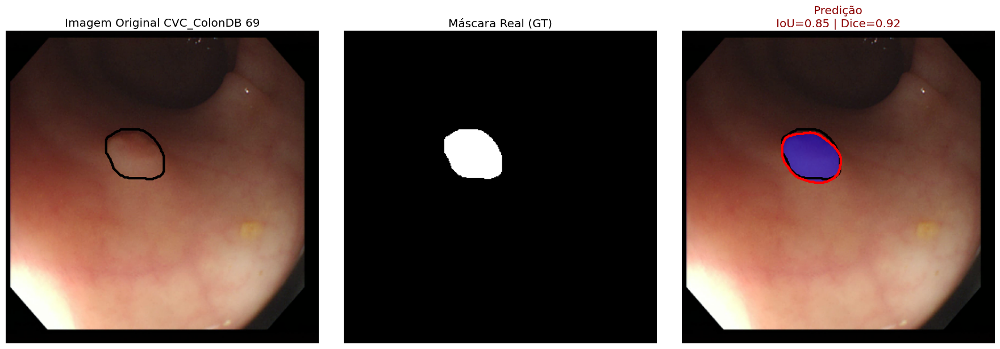

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


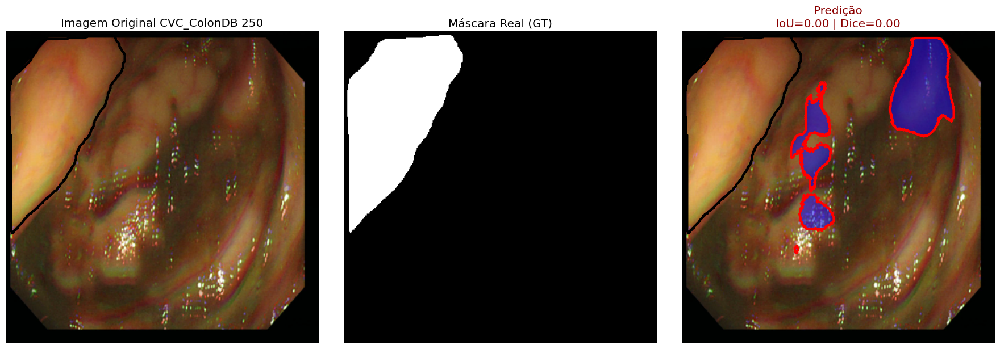

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


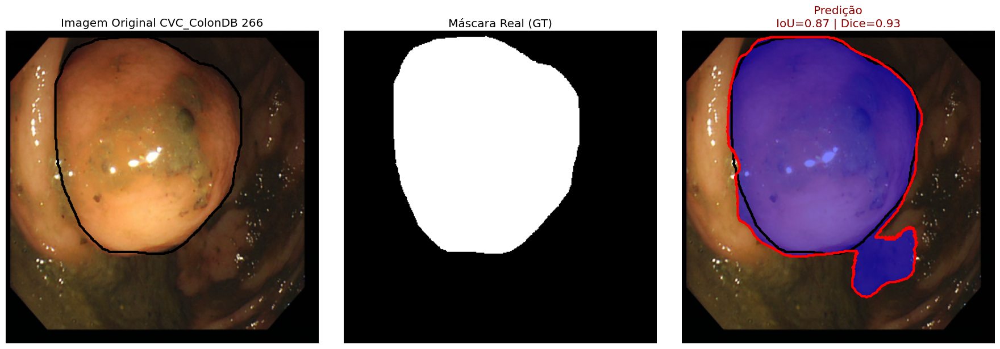

In [ ]:
import random
FIXED_THRESHOLD = 0.3  # Ajustável conforme necessário


# --- Loop para visualizar 20 amostras aleatórias ---
for i in range(30):
    idx = random.randint(0, len(colondb_image_paths) - 1)

    # --- Carrega imagem original ---
    img_bgr = cv2.imread(colondb_image_paths[idx])
    img_bgr = cv2.resize(img_bgr, (IMG_WIDTH, IMG_HEIGHT))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # --- Carrega máscara real (GT) ---
    gt_mask = cv2.resize(cv2.imread(colondb_mask_paths[idx], cv2.IMREAD_GRAYSCALE), (IMG_WIDTH, IMG_HEIGHT))
    gt_mask = (gt_mask > 127).astype(np.uint8)

    # --- Predição ---
    image_input = np.expand_dims(img_rgb.astype(np.float32) / 255.0, axis=0)
    pred_raw = model.predict(image_input)[0, :, :, 0]
    pred_mask = (pred_raw > FIXED_THRESHOLD).astype(np.uint8)

    # --- Métricas ---
    if gt_mask.sum() + pred_mask.sum() == 0:
        dice = 1.0
        iou = 1.0
    else:
        dice = compute_dice(gt_mask, pred_mask)
        iou = jaccard_score(gt_mask.flatten().astype(int), pred_mask.flatten().astype(int))

    # --- Visualização ---
    plt.figure(figsize=(18, 6))

    # Imagem original com contorno da GT
    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.contour(gt_mask, colors='k', linewidths=3, levels=[0.5])
    plt.title(f"Imagem Original CVC_ColonDB {idx}")
    plt.axis('off')

    # Máscara Ground Truth
    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask, cmap='gray')
    plt.title("Máscara Real (GT)")
    plt.axis('off')

    # Predição sobre imagem
    plt.subplot(1, 3, 3)
    overlay = img_rgb.copy().astype(np.float32) / 255.0
    blue_mask = np.zeros_like(overlay)
    blue_mask[:, :, 2] = 1.0  # Azul para a predição
    mask_area = pred_mask > 0
    overlay[mask_area] = 0.5 * overlay[mask_area] + 0.5 * blue_mask[mask_area]
    plt.imshow(overlay)
    plt.contour(gt_mask, colors='k', linewidths=3, levels=[0.5])
    plt.contour(pred_mask, colors='red', linewidths=3, levels=[0.5])
    plt.title(f"Predição\nIoU={iou:.2f} | Dice={dice:.2f}", color='darkred')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
FIXED_THRESHOLD = 0.3

# --- Função principal para análise da base ---
def analisar_base(image_paths, mask_paths, base_name="CVC-ColonDB"):
    resultados = []
    for i in tqdm_notebook(range(len(image_paths))):
        img_path = image_paths[i]
        mask_path = mask_paths[i]

        # --- Imagem e brilho ---
        img_bgr = cv2.imread(img_path)
        img_bgr = cv2.resize(img_bgr, (IMG_WIDTH, IMG_HEIGHT))
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        brilho_medio = img_rgb.mean()

        # --- Máscara GT ---
        gt_mask = cv2.resize(cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE), (IMG_WIDTH, IMG_HEIGHT))
        gt_mask = (gt_mask > 127).astype(np.uint8)
        area_gt = gt_mask.sum()

        # --- Predição ---
        image_input = np.expand_dims(img_rgb.astype(np.float32) / 255.0, axis=0)
        pred_raw = model.predict(image_input)[0, :, :, 0]
        pred_mask = (pred_raw > FIXED_THRESHOLD).astype(np.uint8)

        if gt_mask.sum() + pred_mask.sum() == 0:
            dice = 1.0
            iou = 1.0
        else:
            dice = compute_dice(gt_mask, pred_mask)
            iou = jaccard_score(gt_mask.flatten().astype(int), pred_mask.flatten().astype(int))

        resultados.append({
            "arquivo": os.path.basename(img_path),
            "area_gt": area_gt,
            "brilho": brilho_medio,
            "iou": iou,
            "dice": dice
        })

    df = pd.DataFrame(resultados)

    # --- Estatísticas ---
    print(f"--- Análise: {base_name} ---")
    print(df.describe())

    # --- Distribuições ---
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    sns.histplot(df['dice'], bins=20, kde=True)
    plt.title("Distribuição do Dice")

    plt.subplot(1, 2, 2)
    sns.histplot(df['iou'], bins=20, kde=True)
    plt.title("Distribuição do IoU")
    plt.tight_layout()
    plt.show()

    # --- Dispersões ---
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    sns.scatterplot(x='area_gt', y='dice', data=df)
    plt.title("Área do objeto vs Dice")

    plt.subplot(1, 2, 2)
    sns.scatterplot(x='brilho', y='dice', data=df)
    plt.title("Brilho vs Dice")
    plt.tight_layout()
    plt.show()

    # --- Regressão Linear ---
    X = df[['area_gt', 'brilho']]
    y = df['dice']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    reg = LinearRegression()
    reg.fit(X_train, y_train)
    y_pred = reg.predict(X_test)

    print("--- Regressão Linear ---")
    print(f"Coeficientes: {reg.coef_}")
    print(f"Intercepto: {reg.intercept_:.4f}")
    print(f"R²: {r2_score(y_test, y_pred):.4f}")
    print(f"MSE: {mean_squared_error(y_test, y_pred):.4f}")

    # --- Visualiza os piores casos ---
    piores = df.sort_values("dice").head(5)
    for _, row in piores.iterrows():
        img_path = [p for p in image_paths if row["arquivo"] in p][0]
        mask_path = [p for p in mask_paths if row["arquivo"] in p][0]

        img_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        img_rgb = cv2.resize(img_rgb, (IMG_WIDTH, IMG_HEIGHT))
        gt_mask = cv2.resize(cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE), (IMG_WIDTH, IMG_HEIGHT))
        gt_mask = (gt_mask > 127).astype(np.uint8)

        pred_raw = model.predict(np.expand_dims(img_rgb / 255.0, axis=0))[0, :, :, 0]
        pred_mask = (pred_raw > FIXED_THRESHOLD).astype(np.uint8)

        # Visualiza
        plt.figure(figsize=(18, 5))
        plt.suptitle(f'{row["arquivo"]} | Dice={row["dice"]:.2f} | IoU={row["iou"]:.2f}', fontsize=16)

        plt.subplot(1, 3, 1)
        plt.imshow(img_rgb)
        plt.title("Imagem Original CVC_ColonDB")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(gt_mask, cmap='gray')
        plt.title("Máscara Real")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        overlay = img_rgb.copy().astype(np.float32) / 255.0
        blue_mask = np.zeros_like(overlay)
        blue_mask[:, :, 2] = 1.0
        overlay[pred_mask > 0] = 0.5 * overlay[pred_mask > 0] + 0.5 * blue_mask[pred_mask > 0]
        plt.imshow(overlay)
        plt.contour(gt_mask, colors='k', linewidths=2, levels=[0.5])
        plt.contour(pred_mask, colors='red', linewidths=2, levels=[0.5])
        plt.title("Predição (azul) vs GT (preto)")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    return df

  0%|          | 0/380 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━

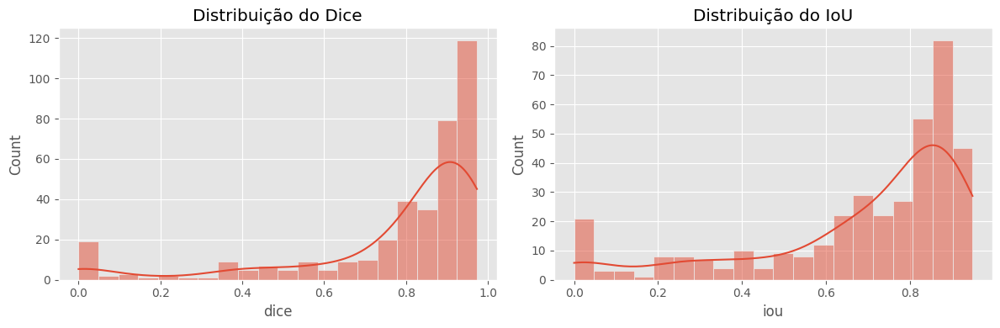

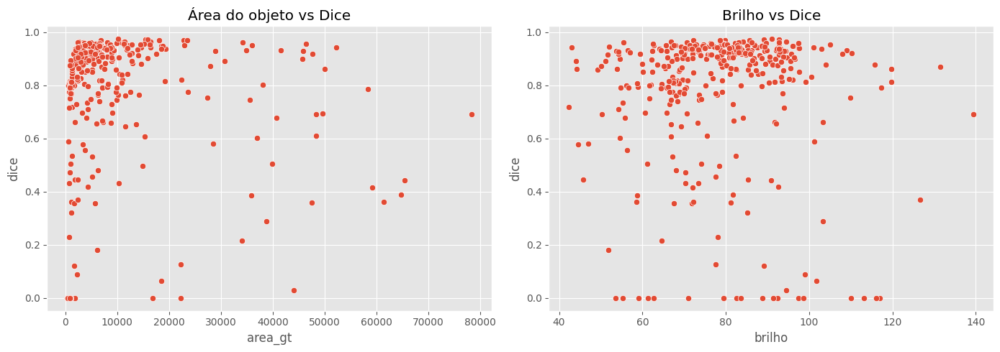

--- Regressão Linear ---
Coeficientes: [-1.06007052e-06 -8.70069132e-04]
Intercepto: 0.8513
R²: -0.0085
MSE: 0.0635
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


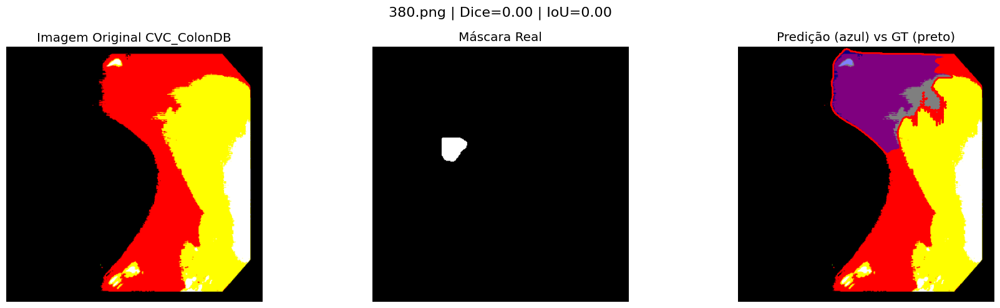

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


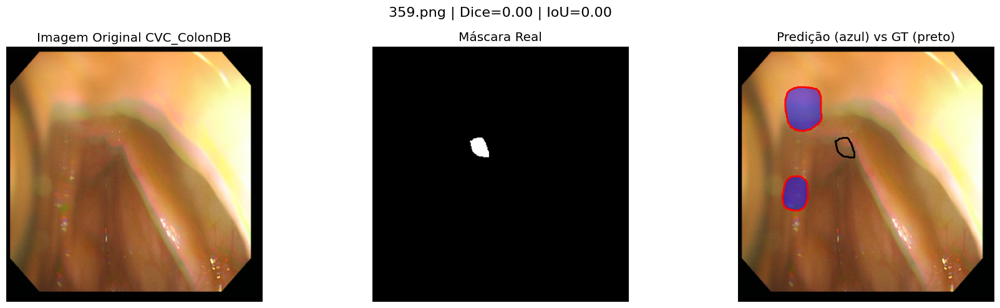

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


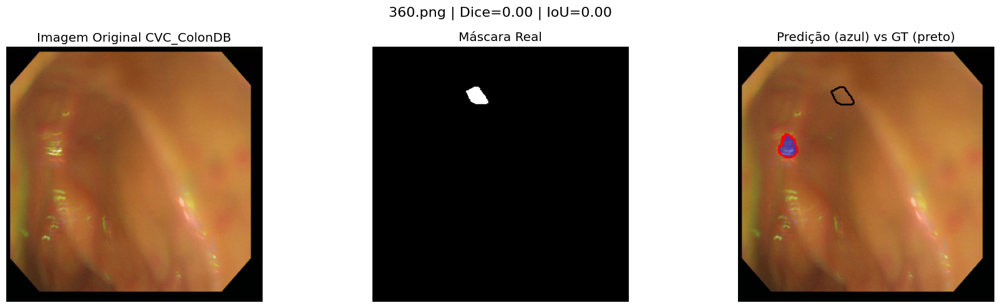

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


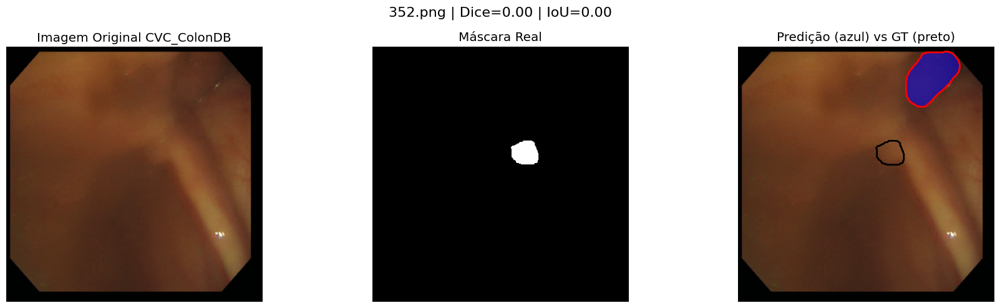

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


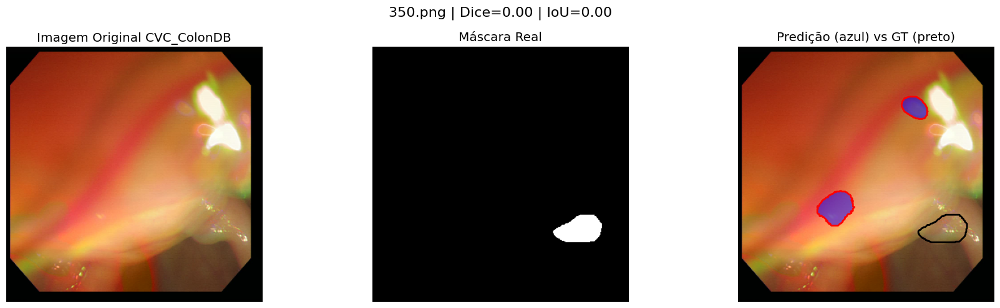

,arquivo,area_gt,brilho,iou,dice
0,1.png,623,56.184864,0.664374,0.798347
1,10.png,2606,69.450265,0.853532,0.920979
2,100.png,6971,79.123970,0.767413,0.868402
3,101.png,5132,74.257509,0.897913,0.946211
4,102.png,13017,87.068593,0.791707,0.883746
...,...,...,...,...,...
375,95.png,2365,101.108137,0.892337,0.943106
376,96.png,3008,93.344729,0.800262,0.889050
377,97.png,2428,96.392323,0.824383,0.903739
378,98.png,5734,59.384330,0.849499,0.918626


In [ ]:
analisar_base(colondb_image_paths, colondb_mask_paths, base_name="CVC-ColonDB")

# **Fim**

# 🖼️ **Painéis apresentados:**
**Imagem Original (CVC-ColonDB)**

Mostra a lesão com seu contorno verdadeiro em preto.

**Ground Truth**

Máscara binária da segmentação real, também com o contorno em preto.

**Predição do Modelo**

Contém a predição sobreposta na imagem:

**Região em azul**: área predita como lesão.

**Contorno vermelho**: contorno da predição.

**Contorno preto**: contorno da ground truth.

# **CONCLUSÕES**


| Métrica            | Valor  | Interpretação                                                       |
| ------------------ | ------ | ------------------------------------------------------------------- |
| **IoU Médio**      | 0.9083 | Ótimo — indica excelente sobreposição entre suas predições e as máscaras verdadeiras.
| **Dice Médio**     |0.9519| Excelente — indica uma sobreposição consistente entre as regiões segmentadas e as regiões reais, refletindo boa sensibilidade e precisão combinadas.
| **Acurácia Média** | 0.9939 | Alta — o modelo classifica corretamente a maioria dos pixels (principalmente fundo).
| **Precisão Média** | 0.9737| Excelente — O modelo não cometeu falsos positivos, ele não detecta regiões extra onde não deveria.
| **Recall Médio**   |0.9312 | Excelente — o modelo detecta boa parte das lesões reais, mas ainda perde algumas regiões menores ou mais difíceis de segmentar.


# **🩺 Diagnóstico do Modelo**

*  O modelo está muito preciso: A alta Precisão indica baixo Falso Positivo (FP) — ou seja, o modelo raramente segmenta onde não deveria.
